## Computational Data Analysis {-}

## Course 02582 {-}

### Andreas Baum, andba@dtu.dk {-}

**NOTE**: Please do not re-distribute the data used in this exercise!

Required R packages: *dill*, *numpy*, *scikit-learn*, *tensorly*, *matplotlib* 

# Background

Fourier Transform Infrared spectroscopy (FTIR) is used in chemistry 
as a rapid analytical method to obtain a snapshot representing the entire chemical 
complexity of a given sample.

The present data describes FTIR spectra of milk samples which were measured time-resolved during an ongoing enzymatic reaction. A protease - an enzyme which is capable of degrading proteins - was added to each sample containing varying casein concentrations (a milk protein). As soon as the protease was injected FTIR spectra were acquired consecutively. Due to the enzyme activity the spectra started to change. The resulting spectral evolution represents the kinetic behavior of the enzymatic reaction monitored. Such spectral evolution profiles (eps) were acquired for each sample given different initial casein concentrations.

Each evolution profile (ep) is represented as a $N \times M$ data matrix with $N$ temporal time points (= number of spectra) and $M$ spectral wavenumbers. Some data pre-processing has been performed for all eps, i.e. the first spectrum of each ep was subtracted from each respective series. Hence, the spectral changes appear in reference to the initial spectrum at time point $0$. 

The goal of this exercise is to establish a suitable PARAFAC model which is capable of quantifying the initial casein concentration. No Cross-Validation should be performed, instead the entire data shall be considered in an unsupervised learning regime. 

Data reference: Baum et al., *Journal of dairy science* 99, no. 8 (**2016**): 6071-6079.


# Questions

## Install all required Python3 packages and load the data! (You may require upgraded packages) 

Load the pickled data (`casein.pkl`) using dill. Each list entry in `eps_list` represents a spectral evolution profile (ep) for a given casein concentration.

In [2]:
import dill
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

dill.load_session('Data/casein.pkl')
# Form tensor x by stacking list of matrices (eps)
x = np.array(eps_list)
# casein_conc contains the known casein concentrations for the 36 samples
print(len(casein_conc))
# scale_temporal and scale_spectra contains the axis labels for the temporal and spectral mode
print(len(scale_temporal))
print(len(scale_spectra))

36
50
135


## What are the dimensions of the tensor $\mathcal{X}$? What are the three modes of the tensor?

In [3]:
print("Shape of x:", x.shape)

Shape of x: (36, 50, 135)


## Visualize some of the eps! You may use the function provided below.

Each ep can be represented as a tensor slab (matrix). Hence, eps can be visualized using 3d surface plots. Let's create a function for convenient surface plotting of eps. 

In [5]:
def surf_plot_comparison(eps_sel, casein_sel):
    # A function for convenient comparison of several eps
    from mpl_toolkits.mplot3d import Axes3D
    from matplotlib import cm
    fig = plt.figure(figsize=(15,10), dpi=600)  
    for pos in range(len(eps_sel)):
        ax = fig.add_subplot(2, 3, pos+1, projection='3d')
        ax.plot_surface(*np.meshgrid(scale_spectra, scale_temporal),
                        eps_sel[pos], cmap=cm.jet)
        ax.view_init(25,235)
        ax.set_zlim(eps_sel.min(), eps_sel.max())
        ax.set_xlabel('$\\lambda$ in $cm^{-1}$')
        ax.set_ylabel('time in $min$')
        ax.set_zlabel('$Abs$')
        ax.set_title(r'$c_{casein} = %.2f \; g/L$' % casein_sel[pos])


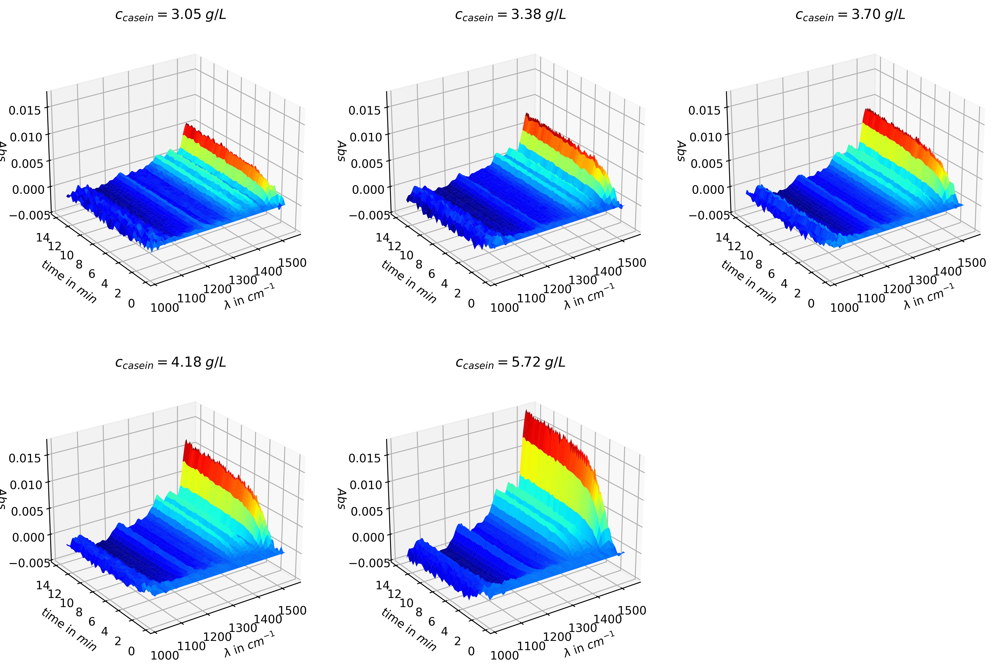

In [6]:
sel = [1,10,16,22,31]
surf_plot_comparison(x[sel,:,:], casein_conc[sel])

The figure shows that spectral evolution intensity increases with higher casein concentration. While all four samples/eps exhibit similar spectral change patterns, the evolution converges over time. The main difference among them lies in the intensity, not the nature, of the spectral changes.

## For the following assume the notation of the decomposition as $\mathcal{X} = A  (B \odot C)^T + \mathcal{E}$, where $\mathcal{X}$, $A$, $B$, $C$ and $\mathcal{E}$ represent the three-way tensor, sample mode loadings (PARAFAC scores), temporal mode loadings, spectral mode loadings and residual tensor, respectively and $\odot$ represents the Khatri-Rao product. Decompose the three-way tensor using PARAFAC. How many components do you require? Why?

Since we saw only one evolution pattern in the figure above we can use only one component. We can check that CORCONDIA score tends to 1.

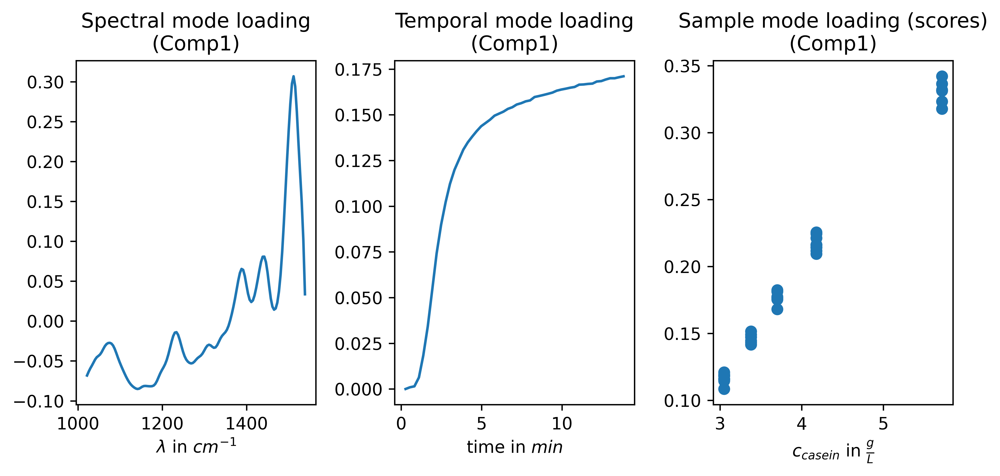

In [12]:
from tensorly.decomposition import parafac
result = parafac(x, 1)
# Extract loadings for sample (a), temporal (b) and spectral (c) mode
a = result[1][0]
b = result[1][1]
c = result[1][2]
# Plot model loadings for first PARAFAC component
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(8,4), dpi=600)
ax[0].plot(scale_spectra, c.ravel())
ax[1].plot(scale_temporal, b.ravel())
ax[2].scatter(casein_conc, a.ravel())
ax[0].set_title('Spectral mode loading\n(Comp1)')
ax[1].set_title('Temporal mode loading\n(Comp1)')
ax[0].set_xlabel('$\\lambda$ in $cm^{-1}$')
ax[1].set_xlabel('time in $min$')
ax[2].set_xlabel('$c_{casein}$ in $\\frac{g}{L}$')
ax[2].set_title('Sample mode loading (scores)\n(Comp1)')
plt.tight_layout()

## Compute the outer vector product of the first component's temporal and spectral loading ($b_1c_1^T$). Surf plot the result. How does the plotted result relate to the plotted eps from the first figure?

You may use the function `surf_plot` given below.

In [13]:
def surf_plot(ep_sel):
    # A function for convenient surf plotting
    from mpl_toolkits.mplot3d import Axes3D
    from matplotlib import cm
    fig = plt.figure(figsize=(10,8), dpi=600)
    ax = fig.add_subplot(1, 1, 1, projection='3d')
    ax.plot_surface(*np.meshgrid(scale_spectra, scale_temporal),
                    ep_sel, cmap=cm.jet)
    ax.view_init(25,235)
    ax.set_xlabel('[$cm^{-1}$]')
    ax.set_ylabel('[$min$]')
    ax.set_zlabel('[$Abs$]')

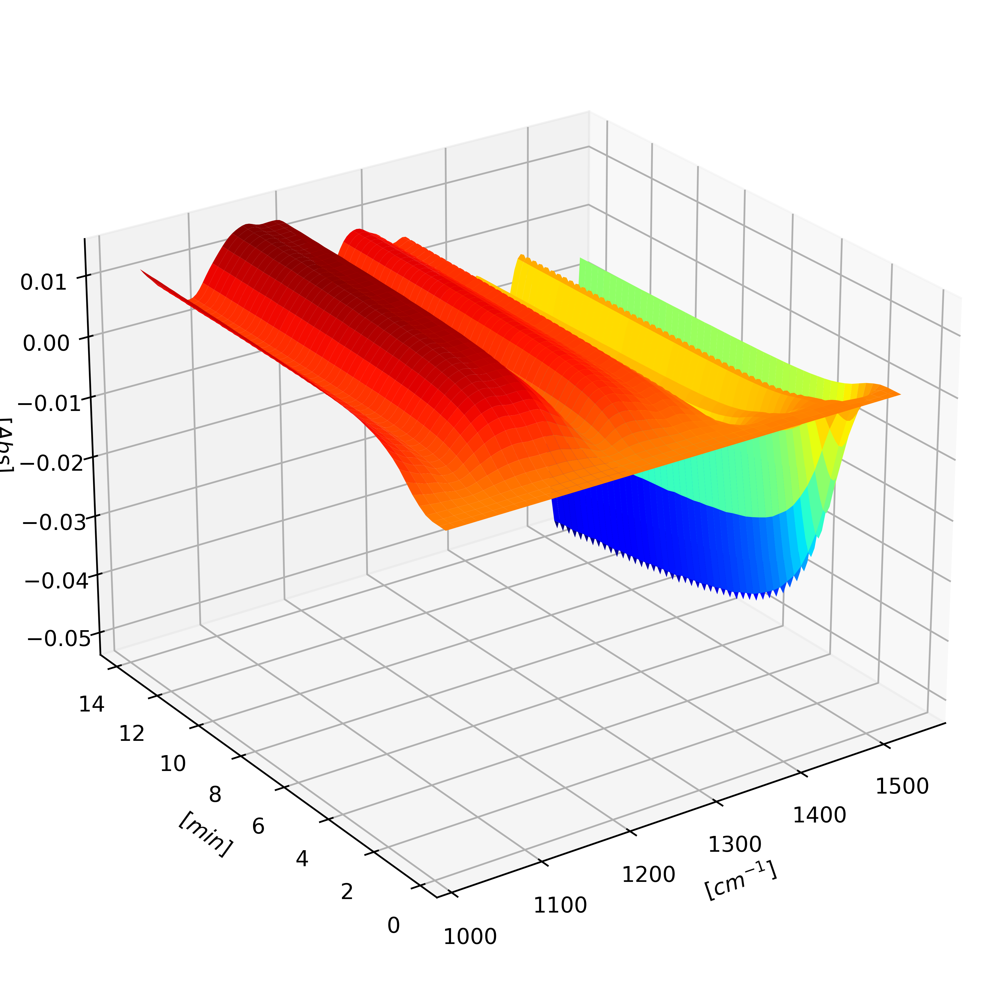

In [15]:
surf_plot(-b.dot(c.T))

It's the loading surface which best estimates the original data in a least squares sense.

## Reconstruct the tensor using $A$, $B$ and $C$, such that $\hat{\mathcal{X}} = A  (B \odot C)^T$. You may simply use the function below. Thereafter, compute the residuals $\mathcal{E} = \mathcal{X} - \hat{\mathcal{\mathcal{X}}}$. Look at some of the residuals using similar surface plots as in question 3.

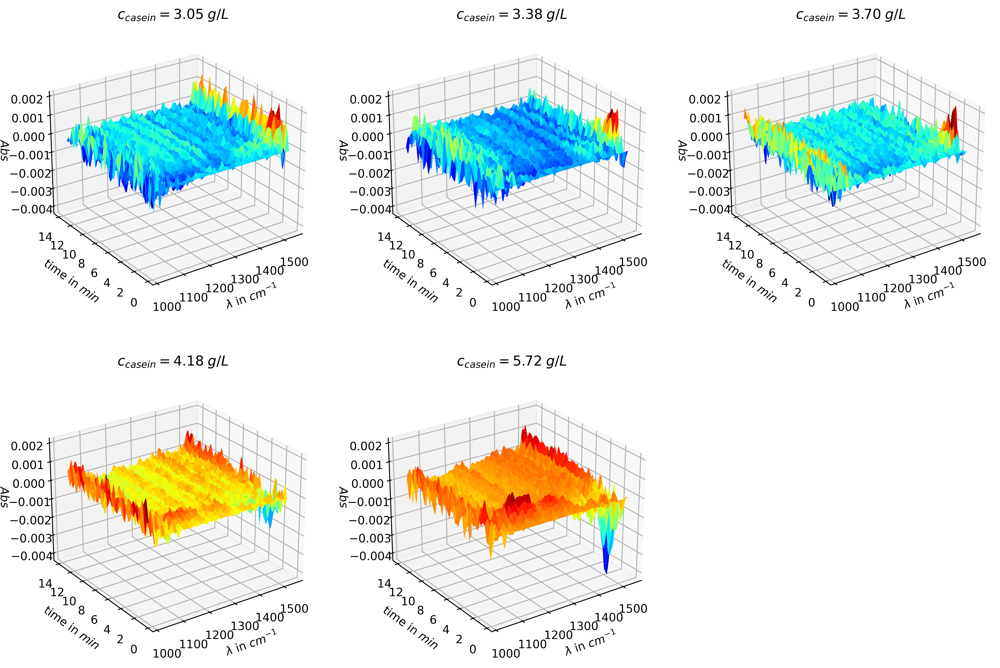

In [17]:
# Reconstruct tensor from X(hat) = ABC
from tensorly.tenalg import khatri_rao
from tensorly import fold, unfold
x_hat = a.dot(khatri_rao([b,c]).T)
x_hat = fold(x_hat, mode=0, shape=x.shape)

# Or reconstruct by simply using the tensorly function
from tensorly.cp_tensor import cp_to_tensor
x_hat2 = cp_to_tensor(result)

# Calculate residuals E = X - X(hat)
e = x - x_hat

# Look at the residuals e
surf_plot_comparison(e[sel,:,:], casein_conc[sel])

## Unfold the tensor appropriately and perform PCA using one component!

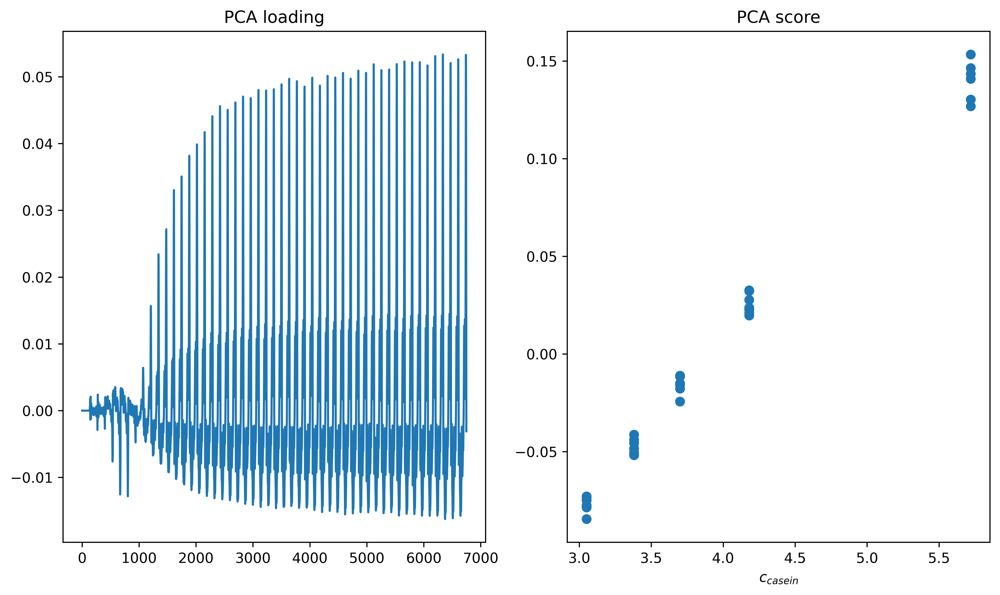

In [18]:
from sklearn.decomposition import PCA
x_unfold = unfold(x, mode=0)
pca1 = PCA(n_components=1)
pca_scores = pca1.fit_transform(x_unfold).ravel()
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,6), dpi=600)
ax[0].plot(pca1.components_[0])
ax[1].scatter(casein_conc,pca_scores)
ax[0].set_title('PCA loading')
ax[1].set_xlabel('$c_{casein}$')
ax[1].set_title('PCA score')
plt.tight_layout()

## Scatter plot the PCA and PARAFAC scores against the casein concentration. What do you observe? Are these unsupervised models appropriate to quantify the casein concentration in milk? How many parameters were fitted using PCA? How many using PARAFAC? What is the advantage of PARAFAC in this application?

In [19]:
# Number of fitted parameters for both models
print('A single PCA component requires %d "fitted" parameters (one loading).' 
      % len(pca1.components_[0]))
print('\nA single PARAFAC component requires %d "fitted" parameters (one spectral + one temporal loading).' 
      % (len(c) + len(b)))

A single PCA component requires 6750 "fitted" parameters (one loading).

A single PARAFAC component requires 185 "fitted" parameters (one spectral + one temporal loading).


From solutions: As it can be seen in the figure above there is a linear relationship between both, the PARAFAC and the PCA scores with the casein concentration. Casein calibrations could therefore be established using both methods. 50\*135 = 6750 parameters were estimated for a single PCA loading, while PARAFAC only required 50+135 = 185 parameters. PARAFAC offers the clear advantage of better model interpretability. Furthermore, PCA might tend to ovefit the data.  PARAFAC intends to fit a single time and spectral profile per component, taking all samples/eps into account. On the other hand, PCA is fitting time and spectral profiles for all samples ("in parallel"). Due to this reason PARAFAC may find satisfactory decompositions in situations where the signal-to-noise ratio is low, while PCA will overfit and not recover the systematic structure of the data. 
